#### Tukey's method

Tukey's method, also known as the Tukey's fences or Tukey's range test, is a statistical technique designed for identifying outliers in a dataset. Developed by the eminent statistician John Tukey, this method relies on the interquartile range (IQR), which is the range between the first quartile (Q1) and the third quartile (Q3) of a distribution. Tukey proposed defining a "fence" around the IQR, with outliers identified as values falling outside these fences. Typically, the lower fence is set at:
$$ Q1 - k \times \text{IQR} $$

and the upper fence is set a: $$ Q3 + k \times \text{IQR} $$

 where \(k\) is a constant multiplier.
A common choice for \(k\) is 1.5, although other values may be used depending on the desired sensitivity to outliers. Tukey's method is widely employed for its simplicity and effectiveness in detecting outliers while accounting for the variability in the central portion of the distributio




#### Calculate number of outliers and its percentage in each variable using Tukey's method

In [ ]:
outliers_data = []

for variable in col_dict.keys():
    q75, q25 = np.percentile(life_expectancy_df[variable], [75, 25])
    iqr = q75 - q25

    min_val = q25 - (iqr * 1.5)
    max_val = q75 + (iqr * 1.5)

    outliers_count = len((np.where((life_expectancy_df[variable] > max_val) | (life_expectancy_df[variable] < min_val))[0]))
    outliers_percentage = outliers_count * 100 / len(life_expectancy_df)

    outliers_data.append({
        'Variable': variable,
        'Outliers Count': outliers_count,
        'Outliers Percentage': outliers_percentage
    })

outliers_table = pd.DataFrame(outliers_data)
display(outliers_table)

,Variable,Outliers Count,Outliers Percentage
0,Life expectancy,17,0.578625
1,Adult Mortality,86,2.927161
2,infant deaths,315,10.721579
3,Alcohol,3,0.102110
4,percentage expenditure,389,13.240300
5,Hepatitis B,222,7.556161
6,Measles,542,18.447924
7,BMI,0,0.000000
8,under-five deaths,394,13.410483
9,Polio,279,9.496256


#### Number and Percentage of ouliers by column

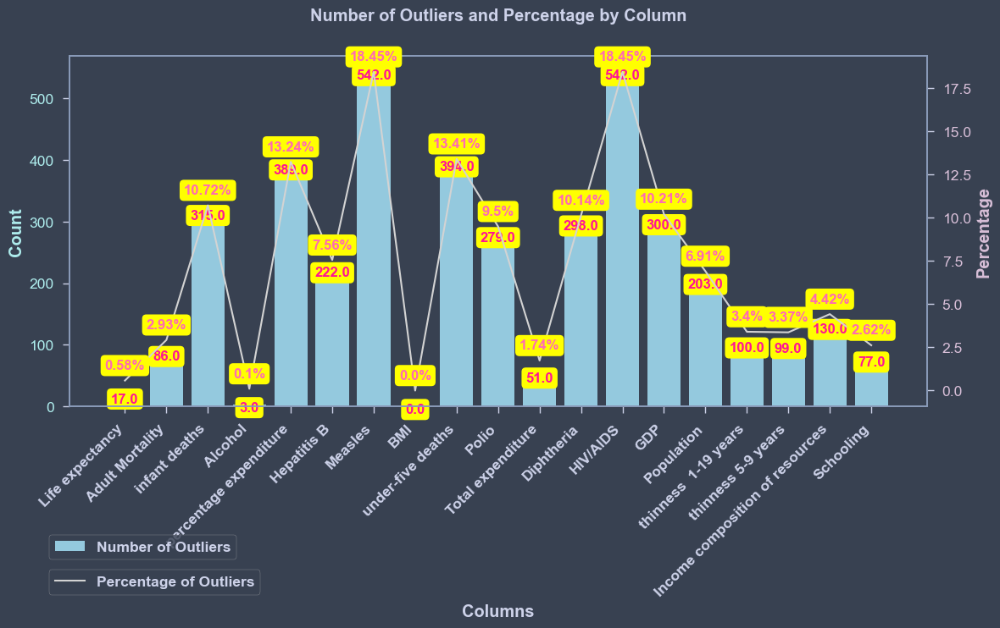

In [ ]:
# Calculate number of outliers and its percentage in each variable using Tukey's method
outliers_count = []
outliers_percentage = []

for variable in col_dict.keys():
    q75, q25 = np.percentile(life_expectancy_df[variable], [75, 25])
    iqr = q75 - q25

    min_val = q25 - (iqr * 1.5)
    max_val = q75 + (iqr * 1.5)

    outliers = np.where((life_expectancy_df[variable] > max_val) | (life_expectancy_df[variable] < min_val))[0]
    outliers_count.append(len(outliers))
    outliers_percentage.append(len(outliers) * 100 / len(life_expectancy_df))

# Create a DataFrame for visualization
outliers_df = pd.DataFrame({'Variable': col_dict.keys(), 'Outliers Count': outliers_count, 'Outliers Percentage': outliers_percentage})

# Create a bar chart for the count of outliers
fig, ax1 = plt.subplots(figsize=(12, 9))

# Bar for the number of outliers
bar1 = sns.barplot(x='Variable', y='Outliers Count', data=outliers_df, color='skyblue', label='Number of Outliers')

ax1.set_xlabel('Columns', fontweight='bold')
ax1.set_ylabel('Count', color='paleturquoise', fontweight='bold')
ax1.tick_params(axis='y', labelcolor='paleturquoise')
ax1.set_title('Number of Outliers and Percentage by Column', pad=30, fontweight='bold')

# Display the values on top of the bars with adjusted vertical positioning
for bar in bar1.patches:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, yval + 0.01 * max(outliers_count), round(yval, 2),
             ha='center', va='top', color='deeppink', fontsize=12, fontweight='bold', bbox=dict(facecolor='yellow', edgecolor='none', boxstyle='round'))

# Create a second y-axis for the percentage of outliers using a line chart
ax2 = ax1.twinx()
line2 = sns.lineplot(x='Variable', y='Outliers Percentage', data=outliers_df, color='lightgray', label='Percentage of Outliers')

ax2.set_ylabel('Percentage', color='thistle', fontweight='bold')
ax2.tick_params(axis='y', labelcolor='thistle')

# Display the values on top of the line chart with adjusted vertical positioning
for i, value in enumerate(outliers_percentage):
    ax2.text(outliers_df['Variable'][i], value + 0.5, f'{round(value, 2)}%',
             ha='center', va='bottom', color='hotpink', fontsize=12, fontweight='bold', bbox=dict(facecolor='yellow', edgecolor='none', boxstyle='round'))

# Set x-axis ticks and labels
ax1.set_xticks(np.arange(len(outliers_df)))
ax1.set_xticklabels(outliers_df['Variable'], rotation=45, ha='right', fontweight='bold')

# Display both legends outside the chart below the x-axis with some space
legend_font = {'weight': 'bold'}
ax1_legend = ax1.legend(loc='lower left', bbox_to_anchor=(-0.05, -0.5), borderaxespad=1.5, prop=legend_font)
ax2_legend = ax2.legend(loc='lower left', bbox_to_anchor=(-0.05, -0.6), borderaxespad=1.5, prop=legend_font)

plt.tight_layout()
plt.show()


#### Winsorization: A Robust Approach for Outlier Treatment

Winsorization is a statistical method designed to address outliers in a dataset, offering robustness in the face of extreme values. This technique, akin to Tukey's method, involves capping extreme values by replacing them with values within specified bounds. The process is particularly useful during data preprocessing, ensuring that extreme values do not unduly influence statistical analyses.

#### Removing Outliers in the variables using Winsorization technique
##### Link for Winsorization technique:
https://www.investopedia.com/terms/w/winsorized_mean.asp

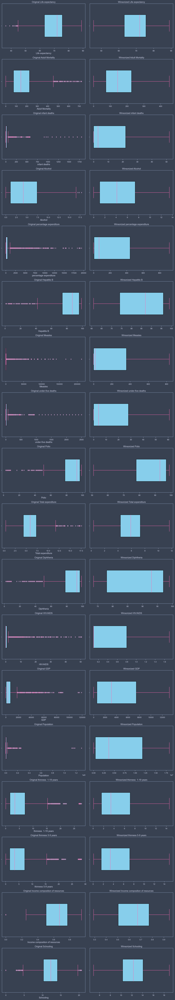

In [ ]:
from scipy.stats.mstats import winsorize


# Define winsorization limits for each column
winsorization_limits = {
    'Life expectancy': (0.01, 0),
    'Adult Mortality': (0, 0.03),
    'infant deaths': (0, 0.12),
    'Alcohol': (0, 0.01),
    'percentage expenditure': (0, 0.15),
    'Hepatitis B': (0.11, 0),
    'Measles': (0, 0.19),
    'under-five deaths': (0, 0.15),
    'Polio': (0.095, 0),
    'Total expenditure': (0, 0.02),
    'Diphtheria': (0.20, 0),
    'HIV/AIDS': (0, 0.19),
    'GDP': (0, 0.13),
    'Population': (0, 0.14),
    'thinness  1-19 years': (0, 0.04),
    'thinness 5-9 years': (0, 0.04),
    'Income composition of resources': (0.05, 0),
    'Schooling': (0.025, 0.01)
}


# Create a new DataFrame to store winsorized data
winsorized_df = pd.DataFrame()

# Initialize dictionaries to store the number of outliers and their percentage for each variable
outliers_count_before = {}
outliers_percentage_before = {}
outliers_count_after = {}
outliers_percentage_after = {}

# Create subplots based on the number of variables
fig, axs = plt.subplots(len(winsorization_limits), 2, figsize=(16, 5 * len(winsorization_limits)))
axs = axs.flatten()

# Iterate through each column and its winsorization limits
for i, (column, limits) in enumerate(winsorization_limits.items()):
    # Plot original data
    plt.subplot(len(winsorization_limits), 2, 2 * i + 1)
    sns.boxplot(x=life_expectancy_df[column], color="skyblue", width=0.5, linewidth=1.5,
                boxprops=dict(facecolor='skyblue', edgecolor='black'),
                whiskerprops=dict(color='hotpink'),
                capprops=dict(color='hotpink'),
                flierprops=dict(markerfacecolor='turquoise', markeredgecolor='hotpink'),
                medianprops=dict(color='hotpink'))
    plt.title(f"Original {column}")

    # Count the number of outliers in original data using Tukey's method
    q75, q25 = np.percentile(life_expectancy_df[column], [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr * 1.5)
    max_val = q75 + (iqr * 1.5)

    outliers_before = (np.where((life_expectancy_df[column] > max_val) | (life_expectancy_df[column] < min_val))[0])
    outliers_count_before[column] = len(outliers_before)
    outliers_percentage_before[column] = outliers_count_before[column] * 100 / len(life_expectancy_df[column])


    # Winsorize the data
    winsorized_data = winsorize(life_expectancy_df[column], limits)

    # Add winsorized data to the new DataFrame
    winsorized_df['winsorized_' + column] = winsorized_data

    # Plot winsorized data
    plt.subplot(len(winsorization_limits), 2, 2 * i + 2)
    sns.boxplot(x=winsorized_data, color="skyblue", width=0.5, linewidth=1.5,
                boxprops=dict(facecolor='skyblue', edgecolor='black'),
                whiskerprops=dict(color='hotpink'),
                capprops=dict(color='hotpink'),
                flierprops=dict(markerfacecolor='turquoise', markeredgecolor='hotpink'),
                medianprops=dict(color='hotpink'))
    plt.title(f"Winsorized {column}")

    # Count the number of outliers in winsorized data using Tukey's method
    q75, q25 = np.percentile(winsorized_data, [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr * 1.5)
    max_val = q75 + (iqr * 1.5)

    outliers_after = (np.where((winsorized_data > max_val) | (winsorized_data < min_val))[0])
    outliers_count_after[column] = len(outliers_after)
    outliers_percentage_after[column] = outliers_count_after[column] * 100 / len(winsorized_data)





# Adjust layout for better spacing
plt.tight_layout()
plt.show()

#### Display a table with the number of outliers before and after winsorization

In [ ]:
from IPython.display import Markdown, display

outliers_table = pd.DataFrame({
    'Variable': list(winsorization_limits.keys()),
    'Outliers Before Winsorization': list(outliers_count_before.values()),
    'Percentage Before Winsorization': list(outliers_percentage_before.values()),
    'Outliers After Winsorization': list(outliers_count_after.values()),
    'Percentage After Winsorization': list(outliers_percentage_after.values())
})

display(Markdown("\n**Outliers Before and After Winsorization:**"))
display(outliers_table)


**Outliers Before and After Winsorization:**

,Variable,Outliers Before Winsorization,Percentage Before Winsorization,Outliers After Winsorization,Percentage After Winsorization
0,Life expectancy,17,0.578625,0,0.0
1,Adult Mortality,86,2.927161,0,0.0
2,infant deaths,315,10.721579,0,0.0
3,Alcohol,3,0.102110,0,0.0
4,percentage expenditure,389,13.240300,0,0.0
5,Hepatitis B,222,7.556161,0,0.0
6,Measles,542,18.447924,0,0.0
7,under-five deaths,394,13.410483,0,0.0
8,Polio,279,9.496256,0,0.0
9,Total expenditure,51,1.735875,0,0.0


#### Display the new DataFrame with winsorized data

In [ ]:
display(winsorized_df.head())

,winsorized_Life expectancy,winsorized_Adult Mortality,winsorized_infant deaths,winsorized_Alcohol,winsorized_percentage expenditure,winsorized_Hepatitis B,winsorized_Measles,winsorized_under-five deaths,winsorized_Polio,winsorized_Total expenditure,winsorized_Diphtheria,winsorized_HIV/AIDS,winsorized_GDP,winsorized_Population,winsorized_thinness 1-19 years,winsorized_thinness 5-9 years,winsorized_Income composition of resources,winsorized_Schooling
0,65.0,263.0,52,0.010000,71.279624,65.0,831,61,51.0,8.16,73.627778,0.1,584.259210,1.828185e+07,14.6,15.0,0.479,10.1
1,77.8,74.0,0,4.600000,364.975229,99.0,0,0,99.0,6.00,99.000000,0.1,3954.227830,2.887300e+04,1.2,1.3,0.762,14.2
2,75.6,19.0,21,5.288333,0.000000,95.0,63,24,95.0,7.08,95.000000,0.1,4132.762920,1.828185e+07,6.0,5.8,0.743,14.4
3,52.4,335.0,52,5.288333,0.000000,64.0,118,61,51.0,7.08,73.627778,1.7,3695.793748,2.785935e+06,8.3,8.2,0.531,11.4
4,76.4,13.0,0,5.288333,0.000000,99.0,0,0,86.0,7.08,99.000000,0.2,13235.977570,1.109741e+07,3.3,3.3,0.784,13.9


#### Plot the histogram (Before Winsorization)

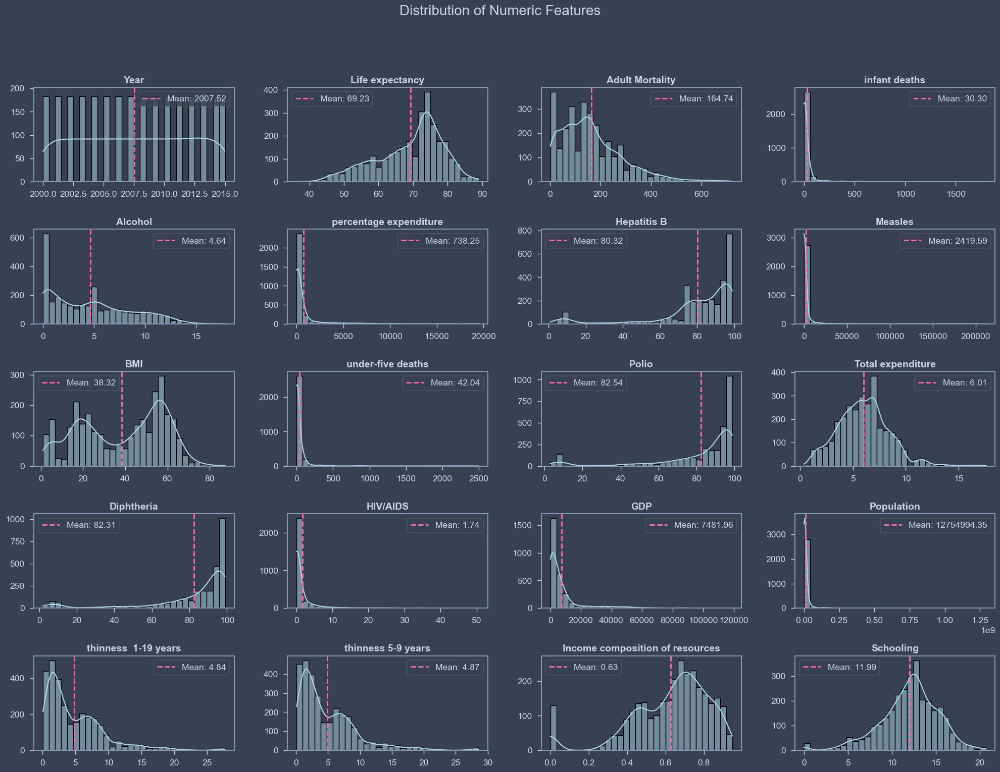

In [ ]:
# Ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Set the color scheme
hist_color = 'lightblue'
line_color = 'hotpink'

# Create a figure
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(20, 15))
fig.suptitle("Distribution of Numeric Features", fontsize=20, y=1.02)

# Get numeric columns
numeric_cols = life_expectancy_df.select_dtypes(exclude=['object']).columns.tolist()

for col, ax in zip(numeric_cols, axes.flatten()):
    # Plot histogram with KDE line
    sns.histplot(life_expectancy_df[col], bins=30, color=hist_color, kde=True, ax=ax, edgecolor='black', linewidth=1)

    # Title for each subplot
    ax.set_title(col, fontsize=14, fontweight='bold')

    # Set axis labels
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Add vertical line at mean if desired
    mean_value = life_expectancy_df[col].mean()
    ax.axvline(mean_value, color=line_color, linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
    ax.legend()

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.97])

# Show the plot
plt.show()

#### Plot the histogram (After Winsorization)

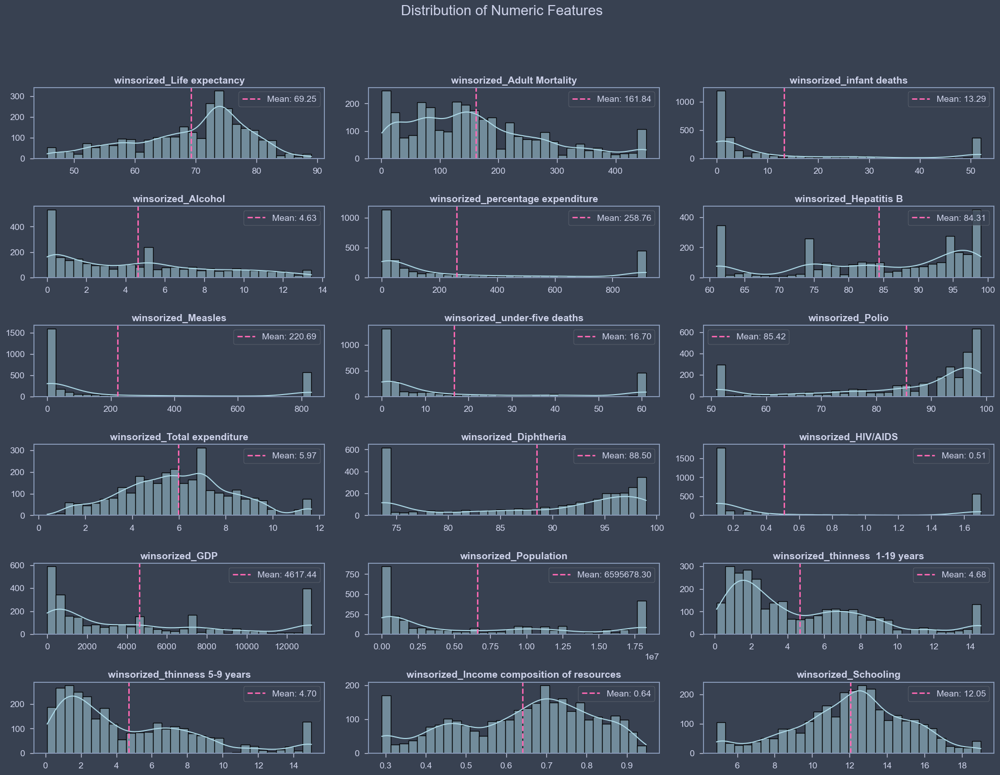

In [ ]:
# Ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Set the color scheme
hist_color = 'lightblue'
line_color = 'hotpink'

# Create a figure
fig, axes = plt.subplots(nrows = 6, ncols = 3, figsize=(20, 15))
fig.suptitle("Distribution of Numeric Features", fontsize=20, y=1.02)

# Get numeric columns
numeric_cols = winsorized_df.select_dtypes(exclude=['object']).columns.tolist()

for col, ax in zip(numeric_cols, axes.flatten()):
    # Plot histogram with KDE line
    sns.histplot(winsorized_df[col], bins=30, color=hist_color, kde=True, ax=ax, edgecolor='black', linewidth=1)

    # Title for each subplot
    ax.set_title(col, fontsize=14, fontweight='bold')

    # Set axis labels
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Add vertical line at mean if desired
    mean_value = winsorized_df[col].mean()
    ax.axvline(mean_value, color=line_color, linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
    ax.legend()

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.97])

# Show the plot
plt.show()

#### Plot Pairplot

<Figure size 2000x2000 with 0 Axes>

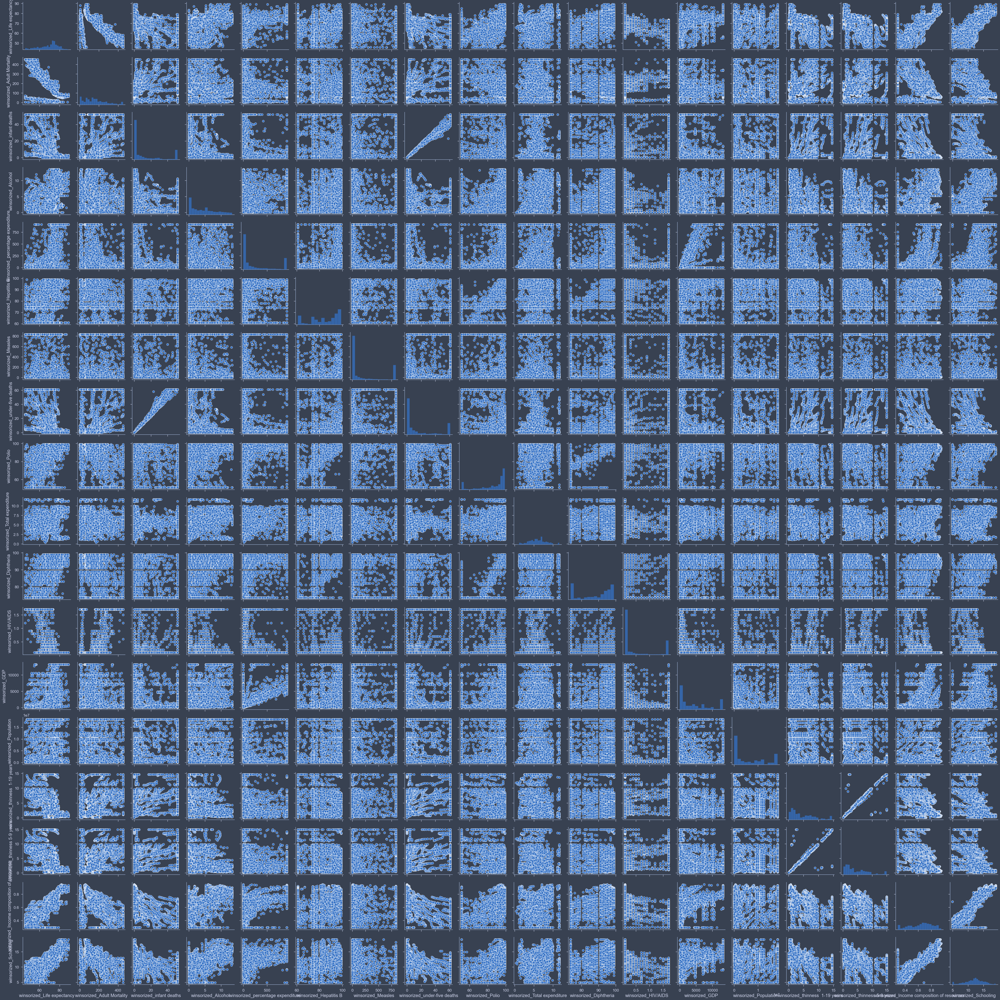

In [ ]:
plt.figure(figsize = (20, 20))
sns.pairplot(winsorized_df)

#### Plot the correlation Matrix (Before Winsorization)

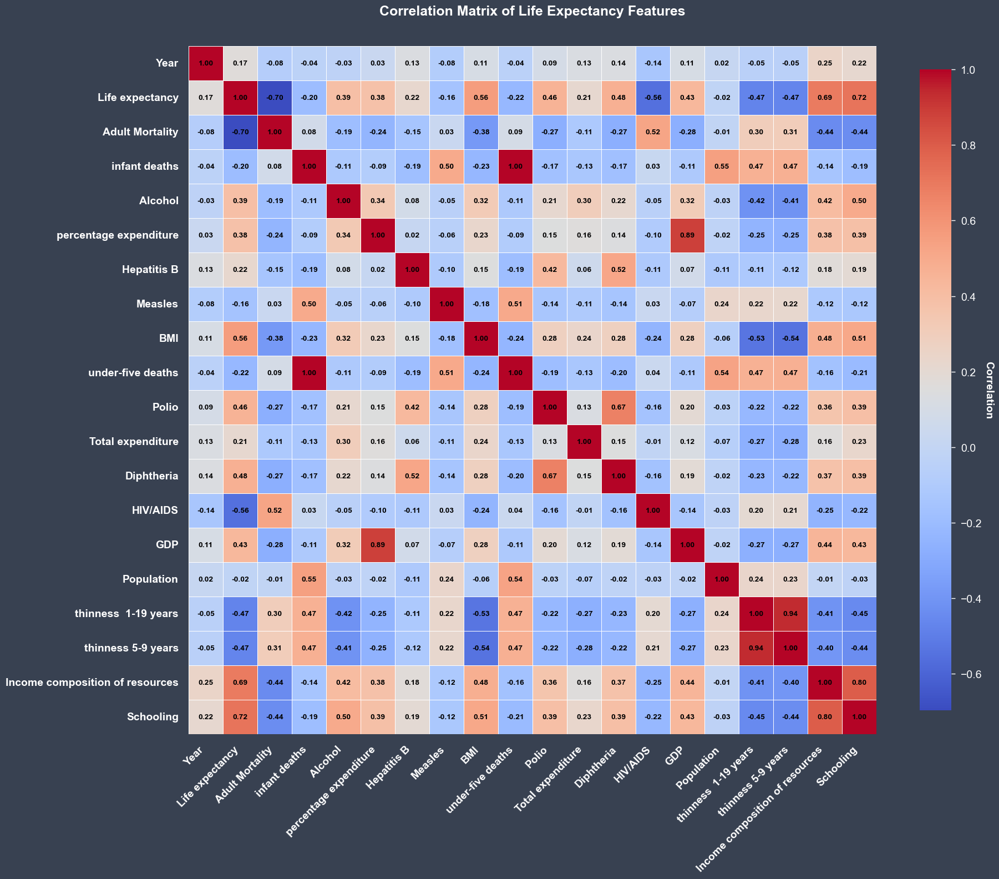

In [ ]:
# Set the Jupyter theme
jtplot.style(theme='oceans16', context='notebook', ticks=True, grid=False)


# Set figure size with adjusted aspect ratio
plt.figure(figsize=(20, 20))

# Select only numeric columns
numeric_columns = life_expectancy_df.select_dtypes(include=['float64', 'int64']).columns
numeric_df = life_expectancy_df[numeric_columns]

# Calculate correlation matrix
corr_matrix = numeric_df.corr()

# Set font scale for the entire plot
sns.set(font_scale=1.2)

# Create heatmap without annotations
heatmap = sns.heatmap(corr_matrix, cmap="coolwarm", linewidths=.5, cbar_kws={"shrink": 0.75}, square=True)

# Customize xticks and yticks
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=14, fontweight="bold", color='white')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=14, fontweight="bold", color='white')

# Customize colorbar label
cbar = heatmap.collections[0].colorbar
cbar.set_label("Correlation", rotation=270, labelpad=15, fontsize=14, fontweight="bold", color='white')

# Set color and fontweight for colorbar tick labels
cbar.ax.yaxis.set_tick_params(color='white', labelcolor='white', labelsize=14, width=1, size=5, which='both')

# Loop to display annotations in all cells
for i in range(len(corr_matrix)):
    for j in range(len(corr_matrix.columns)):
        text = f"{corr_matrix.iloc[i, j]:.2f}"
        plt.text(j + 0.5, i + 0.5, text, fontsize=10, ha='center', va='center', color='black', fontweight='bold')

# Adjust the position of the title
plt.title("Correlation Matrix of Life Expectancy Features", loc="center", pad=40, fontsize=18, fontweight="bold", color='white')

# Show the plot
plt.show()


#### Plot the correlation Matrix (After Winsorization)

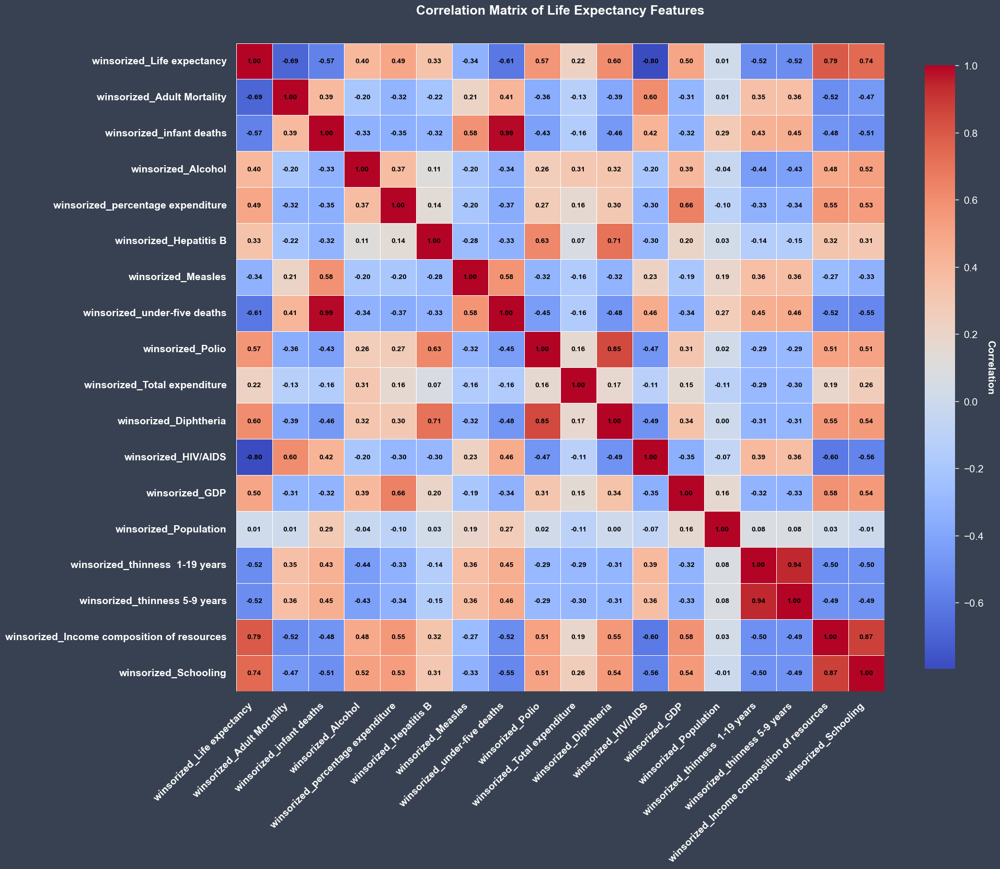

In [ ]:
# Set the Jupyter theme
jtplot.style(theme='oceans16', context='notebook', ticks=True, grid=False)


# Set figure size with adjusted aspect ratio
plt.figure(figsize=(20, 20))

# Select only numeric columns
numeric_columns = winsorized_df.select_dtypes(include=['float64', 'int64']).columns
numeric_df = winsorized_df[numeric_columns]

# Calculate correlation matrix
corr_matrix = numeric_df.corr()

# Set font scale for the entire plot
sns.set(font_scale=1.2)

# Create heatmap without annotations
heatmap = sns.heatmap(corr_matrix, cmap="coolwarm", linewidths=.5, cbar_kws={"shrink": 0.75}, square=True)

# Customize xticks and yticks
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=14, fontweight="bold", color='white')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=14, fontweight="bold", color='white')

# Customize colorbar label
cbar = heatmap.collections[0].colorbar
cbar.set_label("Correlation", rotation=270, labelpad=15, fontsize=14, fontweight="bold", color='white')

# Set color and fontweight for colorbar tick labels
cbar.ax.yaxis.set_tick_params(color='white', labelcolor='white', labelsize=14, width=1, size=5, which='both')

# Loop to display annotations in all cells
for i in range(len(corr_matrix)):
    for j in range(len(corr_matrix.columns)):
        text = f"{corr_matrix.iloc[i, j]:.2f}"
        plt.text(j + 0.5, i + 0.5, text, fontsize=10, ha='center', va='center', color='black', fontweight='bold')

# Adjust the position of the title
plt.title("Correlation Matrix of Life Expectancy Features", loc="center", pad=40, fontsize=18, fontweight="bold", color='white')

# Show the plot
plt.show()


#### Make a new datafram consists of Categorical Variables and Columns with high correlation with Life Expectancy

In [ ]:
LE_df = pd.concat([life_expectancy_df[['Year', 'Status']],
                   winsorized_df[['winsorized_Schooling', 'winsorized_Income composition of resources', 'winsorized_GDP',
                                  'winsorized_HIV/AIDS', 'winsorized_Polio', 'winsorized_under-five deaths', 'winsorized_Adult Mortality', 'winsorized_Life expectancy']]],
                  axis=1)

# Rename columns without 'winsorized_'
LE_df = LE_df.rename(columns={'winsorized_Schooling': 'Schooling',
                              'winsorized_Income composition of resources': 'Income Composition of Resources',
                              'winsorized_GDP': 'GDP',
                              'winsorized_HIV/AIDS': 'HIV/AIDS',
                              'winsorized_Polio': 'Polio',
                              'winsorized_under-five deaths': 'under-five deaths',
                              'winsorized_Adult Mortality': 'Adult Mortality',
                              'winsorized_Life expectancy': 'Life Expectancy'})

# Display the result DataFrame
display(LE_df)

,Year,Status,Schooling,Income Composition of Resources,GDP,HIV/AIDS,Polio,under-five deaths,Adult Mortality,Life Expectancy
0,2015,Developing,10.1,0.479,584.259210,0.1,51.000000,61,263.0,65.0
16,2015,Developing,12.8,0.706,4849.997495,0.2,94.000000,0,175.0,71.0
32,2015,Developing,7.1,0.347,348.381417,1.7,51.000000,21,397.0,52.5
48,2015,Developing,13.2,0.718,6468.471648,0.3,87.000000,7,152.0,73.9
64,2015,Developing,17.2,0.865,187.789910,0.1,99.000000,0,72.0,81.0
...,...,...,...,...,...,...,...,...,...,...
2873,2000,Developing,7.6,0.291,379.119326,1.7,51.000000,61,45.0,47.1
2889,2000,Developing,6.6,0.318,216.172747,1.7,51.000000,57,426.0,48.3
2905,2000,Developing,4.9,0.291,4708.515191,1.7,76.277778,50,38.0,48.9
2921,2000,Developing,12.8,0.646,2213.914880,0.1,97.000000,5,112.0,72.9


**The Winsorized Infant Death rate is also one of the columns that has a high correlation with Life Expectancy. However, as it has a strong correlation with under-five deaths, we choose one of them for our modeling.**

### Descriptive statistics of categorical variables

In [ ]:
# Set the Jupyter theme
jtplot.style(theme='oceans16', context='notebook', ticks=True, grid=False)

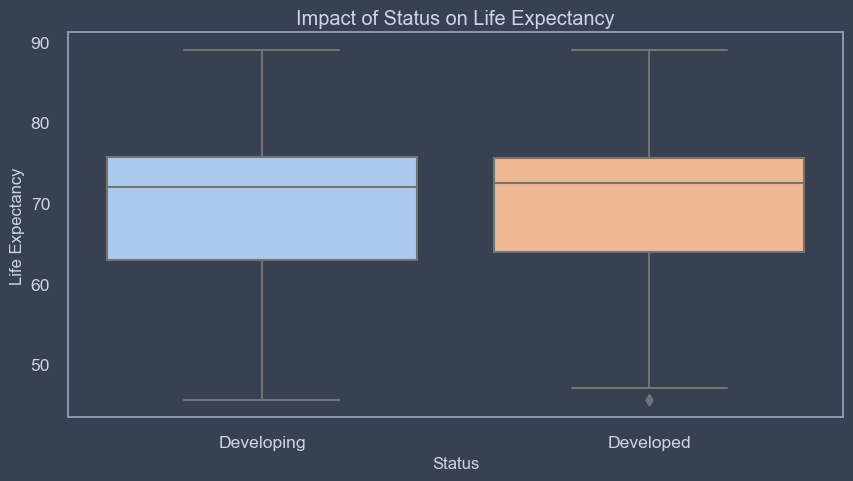

In [ ]:
# Set figure size
plt.figure(figsize=(10, 5))

# Create a box plot
sns.boxplot(x='Status', y='Life Expectancy', data=LE_df, palette='pastel')
plt.xlabel("Status", fontsize=12)
plt.ylabel("Life Expectancy", fontsize=12)
plt.title("Impact of Status on Life Expectancy")
plt.show()

In [ ]:
# Finding the significance of difference of Average_Life_Expectancy between Developed and Developing countries using
# t-test
import scipy.stats as stats
stats.ttest_ind(LE_df.loc[LE_df['Status']=='Developed','Life Expectancy'],LE_df.loc[LE_df['Status']=='Developing','Life Expectancy'])

TtestResult(statistic=0.35931342286299406, pvalue=0.719386472985363, df=2936.0)

##### p value is > 0.05
Hence, the difference of Average_Life_Expectancy between Developed and Developing countries is not significant. We can not consider 'Status' as a feature as it is related to Life Expectancy.

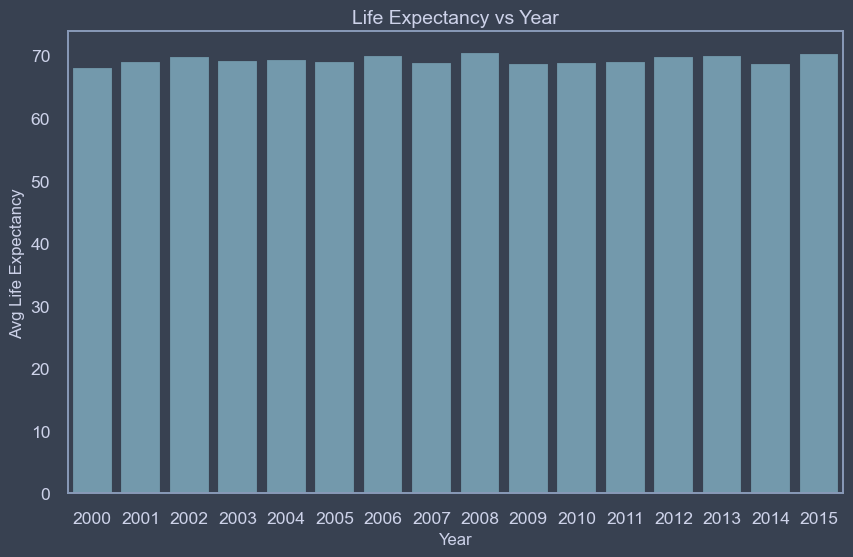

In [ ]:
plt.figure(figsize=(10, 6))

# Create the bar plot
sns.barplot(x=LE_df.groupby('Year')['Year'].count().index,
            y=LE_df.groupby('Year')['Life Expectancy'].mean(),
            color='skyblue', alpha=0.65)

plt.xlabel("Year", fontsize=12)
plt.ylabel("Avg Life Expectancy", fontsize=12)
plt.title("Life Expectancy vs Year", fontsize=14)  # Adjusting title font size

# Display the plot
plt.show()

In [ ]:
# Set the Jupyter theme
jtplot.style(theme='oceans16', context='notebook', ticks=True, grid=False)

#### Showing variables with a high correlation rate with Life Expectancy

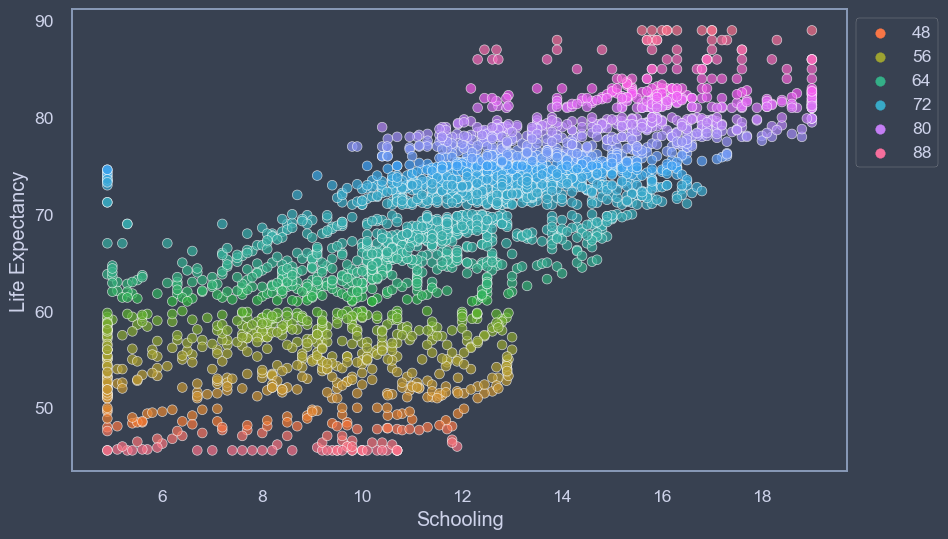

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(data=LE_df, x='Schooling', y='Life Expectancy', hue='Life Expectancy', palette='husl', markers=['o'], alpha=0.7, edgecolor='white', linewidth=0.5)

# Move the legend outside to the right of the plot
scatter_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()

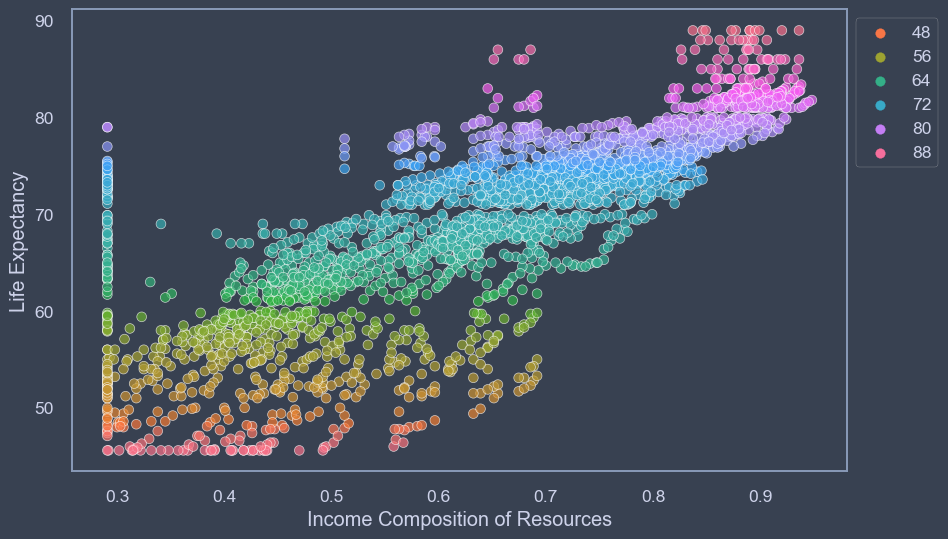

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(data=LE_df, x='Income Composition of Resources', y='Life Expectancy', hue='Life Expectancy', palette='husl', markers=['o'], alpha=0.7, edgecolor='white', linewidth=0.5)

# Move the legend outside to the right of the plot
scatter_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()

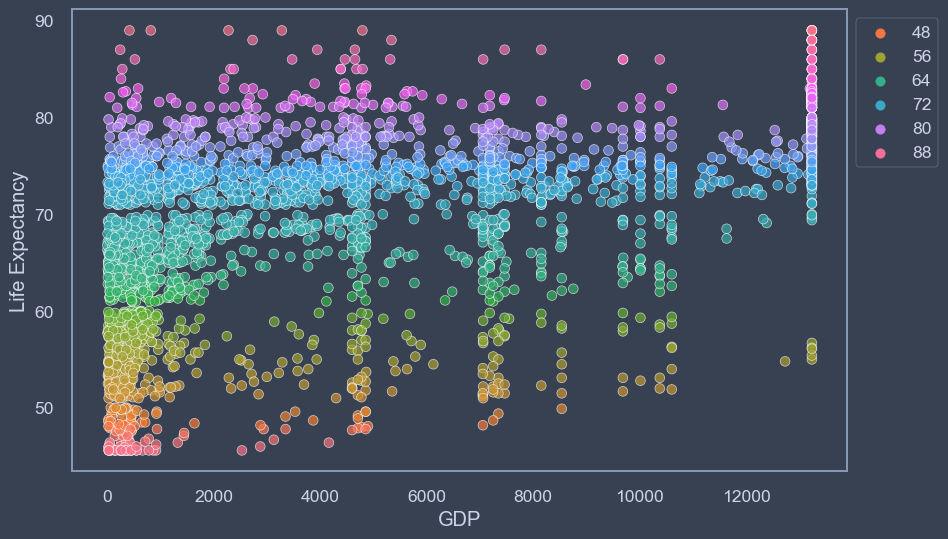

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(data=LE_df, x='GDP', y='Life Expectancy', hue='Life Expectancy', palette='husl', markers=['o'], alpha=0.7, edgecolor='white', linewidth=0.5)

# Move the legend outside to the right of the plot
scatter_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()

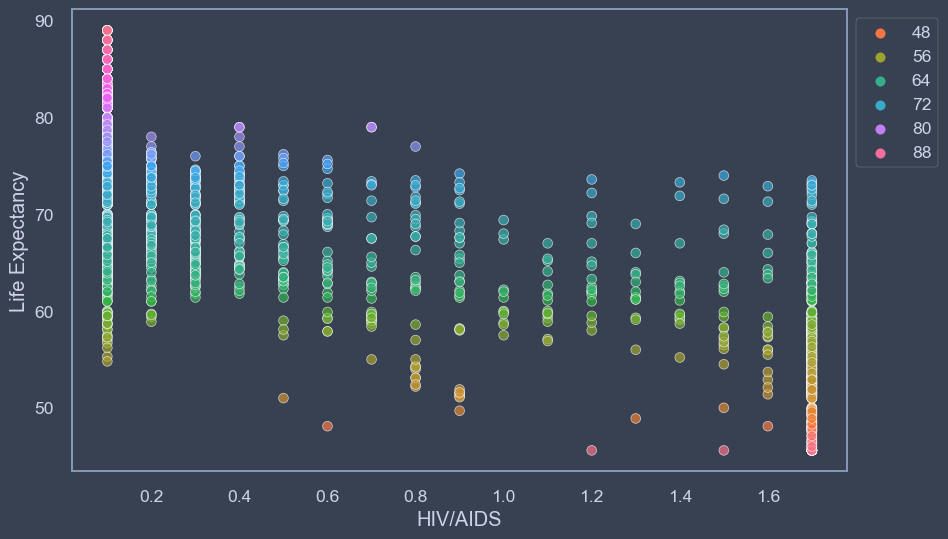

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(data=LE_df, x='HIV/AIDS', y='Life Expectancy', hue='Life Expectancy', palette='husl', markers=['o'], alpha=0.7, edgecolor='white', linewidth=0.5)

# Move the legend outside to the right of the plot
scatter_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()

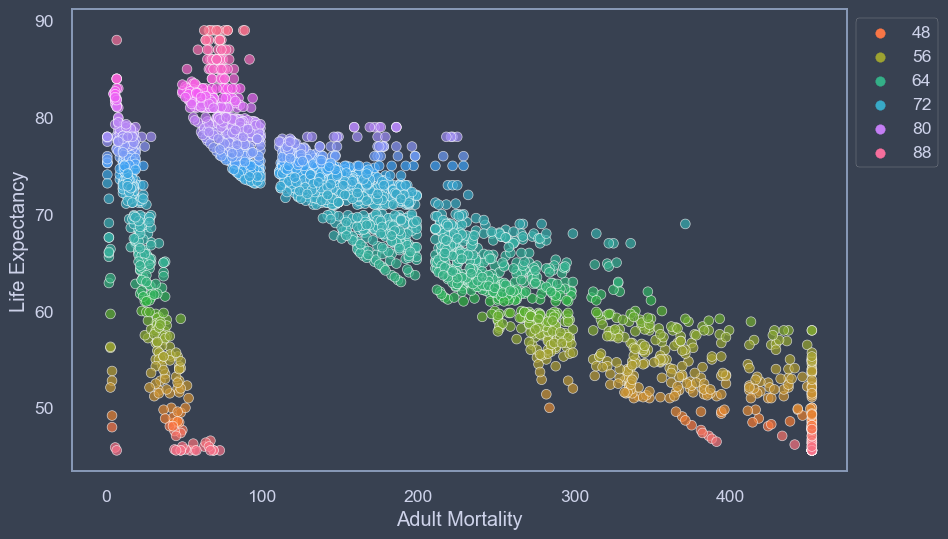

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(data=LE_df, x='Adult Mortality', y='Life Expectancy', hue='Life Expectancy', palette='husl', markers=['o'], alpha=0.7, edgecolor='white', linewidth=0.5)

# Move the legend outside to the right of the plot
scatter_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()

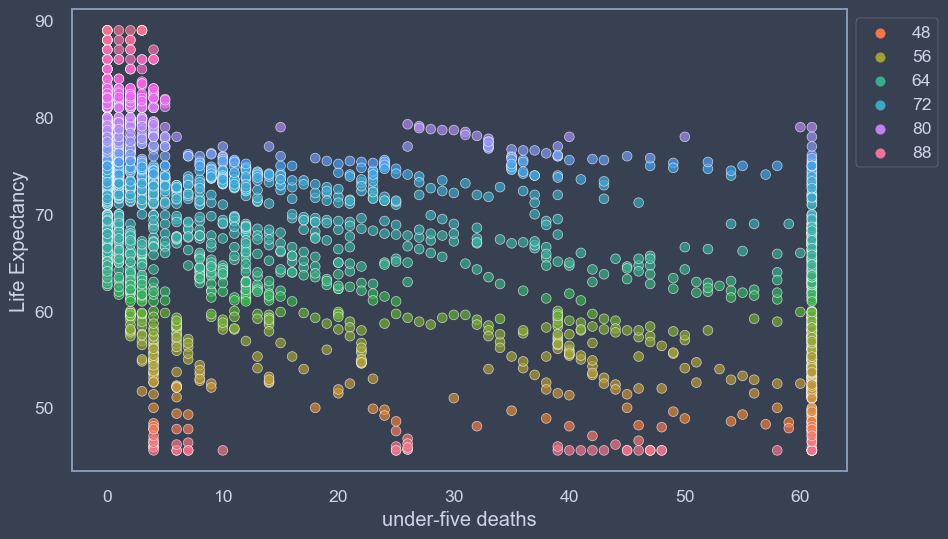

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(data=LE_df, x='under-five deaths', y='Life Expectancy', hue='Life Expectancy', palette='husl', markers=['o'], alpha=0.7, edgecolor='white', linewidth=0.5)

# Move the legend outside to the right of the plot
scatter_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()



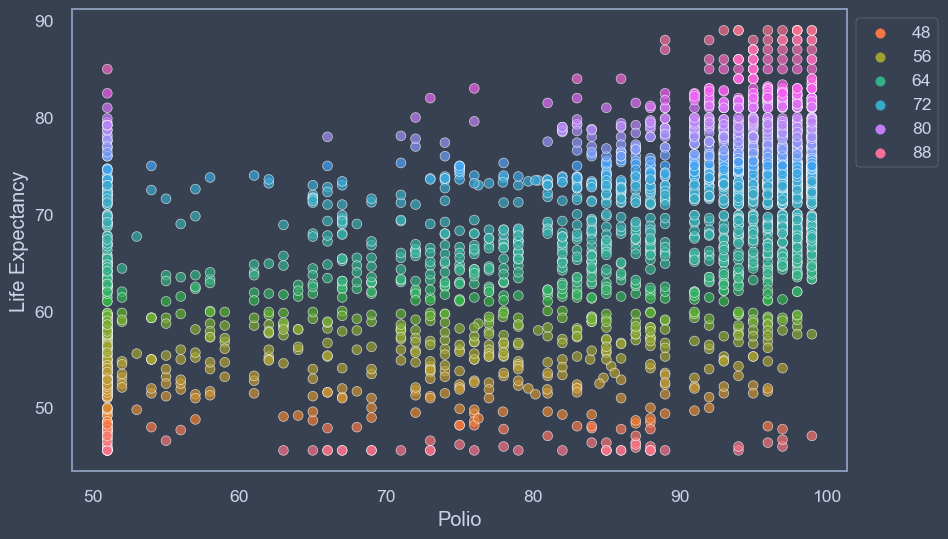

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(data=LE_df, x='Polio', y='Life Expectancy', hue='Life Expectancy', palette='husl', markers=['o'], alpha=0.7, edgecolor='white', linewidth=0.5)

# Move the legend outside to the right of the plot
scatter_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.show()

### Make Model

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR

In [ ]:
# Splitting testing into Indipendent and Dependent Variable

X = LE_df[['Schooling', 'Income Composition of Resources', 'GDP', 'HIV/AIDS', 'Polio', 'under-five deaths', 'Adult Mortality']]
y = LE_df['Life Expectancy']

#### Min-Max Scaling for Feature Normalization

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Min-Max scaling
min_max_scaler = MinMaxScaler()
X_minmax_scaled = min_max_scaler.fit_transform(X)

# Create DataFrames for the scaled features
X_minmax_scaled_df = pd.DataFrame(X_minmax_scaled, columns=X.columns)

Now, X_minmax_scaled_df contains the Min-Max scaled features

In [ ]:
X_minmax_scaled_df.head()

,Schooling,Income Composition of Resources,GDP,HIV/AIDS,Polio,under-five deaths,Adult Mortality
0,0.368794,0.286149,0.044020,0.0000,0.000000,1.000000,0.580931
1,0.560284,0.631659,0.366345,0.0625,0.895833,0.000000,0.385809
2,0.156028,0.085236,0.026197,1.0000,0.000000,0.344262,0.878049
3,0.588652,0.649924,0.488639,0.1250,0.750000,0.114754,0.334812
4,0.872340,0.873668,0.014063,0.0000,1.000000,0.000000,0.157428


In [ ]:
y.head()

0     65.0
16    71.0
32    52.5
48    73.9
64    81.0
Name: Life Expectancy, dtype: float64

#### Splitting data into Train and Test sets

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_minmax_scaled, y, test_size=0.30, random_state=101)

### Model Selection and Evaluation Framework

In [ ]:
# Create an empty DataFrame for modeling
Modeling = pd.DataFrame(columns=['Model', 'Training Score', 'Test R2 Score'])

# Define the model selection function
def select_model(model, Train, Target, x_test, y_test):
    global Modeling  # Access the global DataFrame

    # Fit the model on the training data
    model.fit(Train, Target)

    # Calculate the score of the model on the training data
    train_score = model.score(Train, Target)
    print(f"Score of the {type(model).__name__} model on the training data is: {train_score}")

    # Make predictions on the test data
    predictions = np.round(model.predict(x_test), decimals=1)

    # See R2 score on the test data
    test_r2_score = r2_score(y_test, predictions)
    print(f"R2 score of the {type(model).__name__} model on the test data is: {test_r2_score}")

    # Create a DataFrame for the current model's scores
    model_scores = pd.DataFrame({'Model': [type(model).__name__], 'Training Score': [train_score], 'Test R2 Score': [test_r2_score]})

    # Concatenate the model_scores DataFrame with the Modeling DataFrame
    Modeling = pd.concat([Modeling, model_scores], ignore_index=True)


#### LinearRegression Model

In [ ]:
# Instantiate the LinearRegression model
model = LinearRegression()

# Call the function with LinearRegression model
select_model(model, X_train, y_train, X_test, y_test)

Score of the LinearRegression model on the training data is: 0.8477897193708867
R2 score of the LinearRegression model on the test data is: 0.8294017253940305


#### SupportVectorRegression Model

In [ ]:
# Instantiate the SupportVectorRegression model with specific parameters
svr_model = SVR(C=9.0, epsilon=0.9, kernel='rbf')

# Call the function with SupportVectorRegression model
select_model(svr_model, X_train, y_train, X_test, y_test)

Score of the SVR model on the training data is: 0.9222027487858514
R2 score of the SVR model on the test data is: 0.9100067303188345


#### RandomForestRegressor Model

In [ ]:
# Instantiate the RandomForestRegressor model with specific parameters
rf_model = RandomForestRegressor(n_estimators=100, max_depth=7, min_samples_split=5)

# Call the function with RandomForestRegressor model
select_model(rf_model, X_train, y_train, X_test, y_test)

Score of the RandomForestRegressor model on the training data is: 0.9604180452959549
R2 score of the RandomForestRegressor model on the test data is: 0.9345294241821204


#### GradientBoostingRegressor Model

In [ ]:
# Instantiate the GradientBoostingRegressor model with specific parameters
gb_model = GradientBoostingRegressor(n_estimators=100, max_depth=6, min_samples_split=5)

# Call the function with GradientBoostingRegressor model
select_model(gb_model, X_train, y_train, X_test, y_test)

Score of the GradientBoostingRegressor model on the training data is: 0.990258179149136
R2 score of the GradientBoostingRegressor model on the test data is: 0.9538796959708531


#### rename model name

In [ ]:

names = ['LinearRegression', 'SuportVectorRegression', 'RandomForestRegressor', 'GradientBoostingRegressor']

# loop over the list to rename the model column
Modeling['Model'] = names

# drop the original "Model" column
Modeling.drop(columns='Model', inplace=True)

### Create a bar plot for both training and test scores

In [ ]:
from jupyterthemes import jtplot
jtplot.style(theme = 'oceans16', context = 'notebook', ticks = True, grid = False)
# setting the style of the notebook to be monokai theme
# this line of code is important to ensure that we are able to see the x and y axes clearly
# If you don't run this code line, you will notice that the xlabel and ylabel on any plot is black on black and it will be hard to see them.

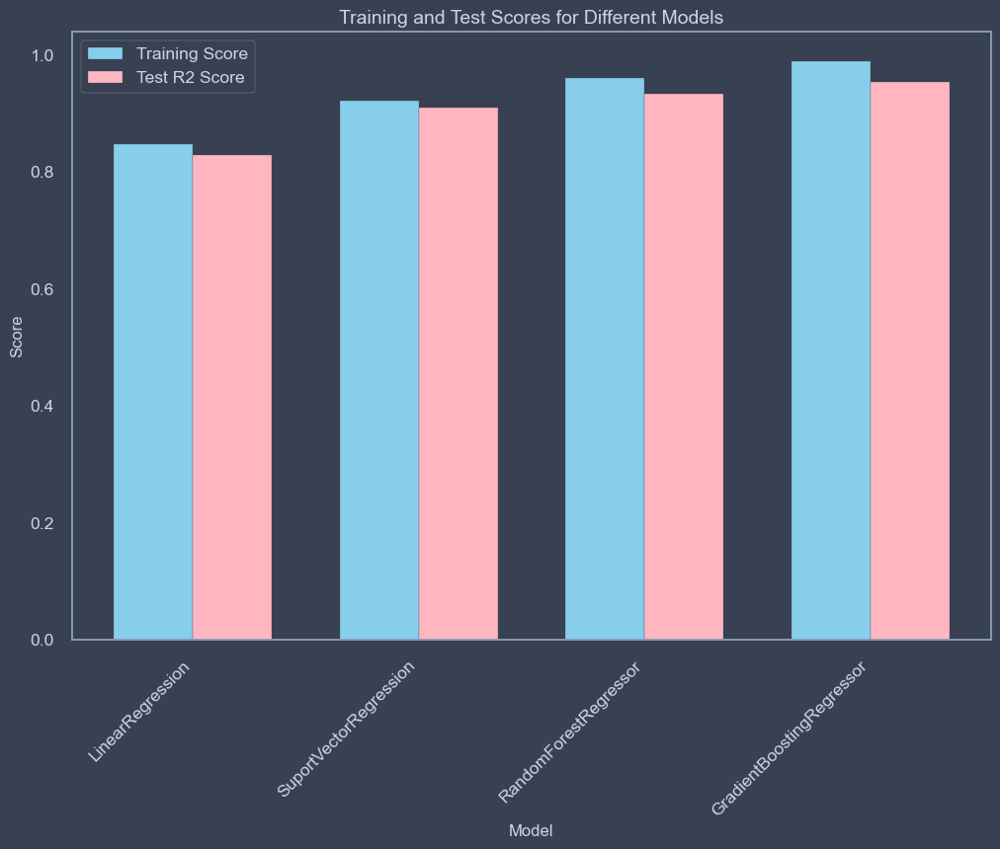

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

# Bar width for better separation
bar_width = 0.35

# Plot training scores
ax.bar(Modeling.index - bar_width/2, Modeling['Training Score'], bar_width, color='skyblue', label='Training Score')

# Plot test R2 scores
ax.bar(Modeling.index + bar_width/2, Modeling['Test R2 Score'], bar_width, color='lightpink', label='Test R2 Score')

ax.set_xlabel("Model", fontsize=12)
ax.set_ylabel("Score", fontsize=12)
ax.set_title("Training and Test Scores for Different Models", fontsize=14)
ax.set_xticks(Modeling.index)
ax.set_xticklabels([name for name in names], rotation=45, ha='right')  # Use provided names as labels

ax.legend()  # Display legend to differentiate training and test scores

# Show the plot
plt.show()